# Анализ мобильной карточной игры Kosmos

**Задачи:**
* Изучение поведения пользователей
* Поиск новых точек роста

**Данные для исследования:**
* `user_id` - уникальный id игрока
* `media_source` - источник установки
    * Organic - пришедший к нам без рекламы (через стор)
    * ad-traffic - пришёл к нам по рекламе
* `client_time` - время события
* `event_name` - имя события
* `event_data` - дополнительные данные описывающие событие
* `session_index` - порядковый номер сессии, в которую это событие произошло
* `game_status` -статус прогресса пользователя на момент любого события
    * Coins - кол-во монет
    * level - последний открытый уровень (уникальный идентификатор уровня)
    * bet - величина ставки



[Презентация по результатам исследования](https://drive.google.com/file/d/1xGTB8SCsyTcvl3N1px0HYbyjbiCFMxJY/view?usp=sharing)

## Изучение данных

Обязательно нужно обновить plotly

In [ ]:
!pip install --upgrade plotly

In [2]:
import pandas as pd
import numpy as np
import plotly.io as pio
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go

import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_colwidth = 999
pio.templates.default = 'plotly_dark'
sns.set(style='white')

In [3]:
try:
    df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Тестовые задания/Kosmos/data.csv')
except Exception as err:
    print('Error:', err)  

In [4]:
df.sample(n=5)

,user_id,media_source,client_time,session_index,game_status,event_name,event_data
372212,60bb320573c31e6a292b7a6f,organic,2021-06-08 12:27:30,58,"{""coins"":94660,""freeRounds"":0,""freeUndo"":7,""freeWildCard"":2,""freeAddCards"":4,""level"":201,""map"":1,""bet"":3,""gladeId"":9,""league"":1,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelStart,"{""retry"":false,""level"":102,""levelLoop"":201,""gameType"":0,""VIPStatus"":0,""price"":3500,""cardsInHand"":25,""baseLuckyIndex"":0,""targetGoldIndex"":0,""targetCoins"":0,""totalLuckyIndex"":0,""prediction"":""VictoryWith0Cards""}"
293838,60bba8bf73c31e6a292b7aad,organic,2021-06-05 17:29:09,2,"{""coins"":41364,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":0,""level"":51,""map"":1,""bet"":3,""gladeId"":3,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",learning,"{""name"":""CRUISE_GET_CARD_FROM_DECK_MORE"",""level"":17}"
102285,60bb386a4770af6a2faa0584,organic,2021-06-05 16:05:42,10,"{""coins"":46061,""freeRounds"":0,""freeUndo"":2,""freeWildCard"":0,""freeAddCards"":0,""level"":77,""map"":1,""bet"":1,""gladeId"":6,""league"":0,""gameType"":0,""VIPPointsAmount"":6,""VIPStatus"":0}",getCoins,"{""amount"":439,""from"":""DropCard""}"
301419,60bbc6767c80da6a9442cc04,organic,2021-06-05 19:14:43,2,"{""coins"":15250,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":2,""freeAddCards"":3,""level"":14,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",learning,"{""name"":""CRUISE_GET_CARD_FROM_DECK_MORE"",""level"":8}"
301536,60bbc7cb12667e6a8d10779e,organic,2021-06-05 19:16:33,1,"{""coins"":38284,""freeRounds"":0,""freeUndo"":7,""freeWildCard"":2,""freeAddCards"":3,""level"":49,""map"":1,""bet"":3,""gladeId"":3,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",learning,"{""name"":""CRUISE_GET_CARD_FROM_DECK_MORE"",""level"":16}"


In [5]:
df.shape

(396099, 7)

## Предобработка данных

In [6]:
def primary_info(df):
    display(df.head())
    print()
    print('Проверка на пропущенные значения:')
    display(pd.DataFrame(round((df.isna().mean()*100),2)).style.background_gradient('coolwarm'))
    print('----------------')
    print()
    print('Проверка типов данных на корректность:')
    print(df.info())
    print('----------------')
    print()
    print('Количество полных дубликатов:', df.duplicated().sum())

In [7]:
primary_info(df)

,user_id,media_source,client_time,session_index,game_status,event_name,event_data
0,60c588d7b4d1b24b40531f29,organic,2021-06-05 07:23:06,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""Xiaomi POCO M2 Pro"",""graphicMemory"":2048,""systemMemory"":5582}"
1,60d34c7ab4d1b24b405324ac,organic,2021-06-05 16:33:26,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-J200G"",""graphicMemory"":256,""systemMemory"":892}"
2,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:02:07,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-G781B"",""graphicMemory"":2048,""systemMemory"":5562}"
3,60bac0e912667e6a8d107731,ad-traffic,2021-06-05 00:04:29,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-T290"",""graphicMemory"":512,""systemMemory"":1847}"
4,60babfb17c80da6a9442cb87,organic,2021-06-05 00:05:16,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-N960F"",""graphicMemory"":2048,""systemMemory"":5616}"



Проверка на пропущенные значения:


,0
user_id,0.000000
media_source,0.000000
client_time,0.000000
session_index,0.000000
game_status,0.000000
event_name,0.000000
event_data,0.000000


----------------

Проверка типов данных на корректность:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396099 entries, 0 to 396098
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   user_id        396099 non-null  object
 1   media_source   396099 non-null  object
 2   client_time    396099 non-null  object
 3   session_index  396099 non-null  int64 
 4   game_status    396099 non-null  object
 5   event_name     396099 non-null  object
 6   event_data     396099 non-null  object
dtypes: int64(1), object(6)
memory usage: 21.2+ MB
None
----------------

Количество полных дубликатов: 897


* Пропусков нет
* Названия столбцов корректные
* `client_time` стоит привести к типу datetime
* Полных дубликатов 897, поглядим на них

In [8]:
df['client_time'] = pd.to_datetime(df['client_time'])

In [9]:
df[df.duplicated(keep=False)]

,user_id,media_source,client_time,session_index,game_status,event_name,event_data
2375,60c588d7b4d1b24b40531f29,organic,2021-06-05 08:12:59,2,"{""coins"":78010,""freeRounds"":0,""freeUndo"":5,""freeWildCard"":2,""freeAddCards"":1,""level"":32,""map"":1,""bet"":1,""gladeId"":4,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",getBooster,"{""type"":""freeExtraCards"",""from"":""UseInGame"",""amount"":-1}"
2376,60c588d7b4d1b24b40531f29,organic,2021-06-05 08:12:59,2,"{""coins"":78010,""freeRounds"":0,""freeUndo"":5,""freeWildCard"":2,""freeAddCards"":1,""level"":32,""map"":1,""bet"":1,""gladeId"":4,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",getBooster,"{""type"":""freeExtraCards"",""from"":""UseInGame"",""amount"":-1}"
8942,60bb11bf7c80da6a9442cbaa,organic,2021-06-05 06:37:37,1,"{""coins"":69675,""freeRounds"":0,""freeUndo"":4,""freeWildCard"":4,""freeAddCards"":1,""level"":26,""map"":1,""bet"":1,""gladeId"":4,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",getBooster,"{""type"":""freeExtraCards"",""from"":""GemHunt_TournamentStageReward"",""amount"":1}"
8943,60bb11bf7c80da6a9442cbaa,organic,2021-06-05 06:37:37,1,"{""coins"":69675,""freeRounds"":1,""freeUndo"":4,""freeWildCard"":4,""freeAddCards"":1,""level"":26,""map"":1,""bet"":1,""gladeId"":4,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",getBooster,"{""type"":""freeLevels"",""from"":""GemHunt_TournamentStageReward"",""amount"":1}"
8944,60bb11bf7c80da6a9442cbaa,organic,2021-06-05 06:37:37,1,"{""coins"":69675,""freeRounds"":0,""freeUndo"":4,""freeWildCard"":4,""freeAddCards"":1,""level"":26,""map"":1,""bet"":1,""gladeId"":4,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",getBooster,"{""type"":""freeExtraCards"",""from"":""GemHunt_TournamentStageReward"",""amount"":1}"
...,...,...,...,...,...,...,...
395341,60bb1f6112667e6a8d107750,ad-traffic,2021-06-11 06:08:11,39,"{""coins"":990,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":166,""map"":1,""bet"":1,""gladeId"":10,""league"":1,""gameType"":0,""VIPPointsAmount"":18,""VIPStatus"":0}",levelStart,"{""retry"":false,""level"":166,""levelLoop"":0,""gameType"":0,""VIPStatus"":0,""price"":2200,""cardsInHand"":14,""baseLuckyIndex"":-1,""targetGoldIndex"":-3,""targetCoins"":-135170,""totalLuckyIndex"":-3,""prediction"":""DefeatWith1Or2Cards""}"
395786,60bb989373c31e6a292b7aa1,organic,2021-06-11 09:51:43,34,"{""coins"":31847,""freeRounds"":0,""freeUndo"":1,""freeWildCard"":3,""freeAddCards"":0,""level"":230,""map"":2,""bet"":1,""gladeId"":14,""league"":1,""gameType"":0,""VIPPointsAmount"":27,""VIPStatus"":0}",levelStart,"{""retry"":true,""level"":230,""levelLoop"":0,""gameType"":0,""VIPStatus"":0,""price"":2600,""cardsInHand"":22,""baseLuckyIndex"":2,""targetGoldIndex"":-3,""targetCoins"":-347055,""totalLuckyIndex"":-3,""prediction"":""DefeatWith1Or2Cards""}"
395787,60bb989373c31e6a292b7aa1,organic,2021-06-11 09:51:43,34,"{""coins"":31847,""freeRounds"":0,""freeUndo"":1,""freeWildCard"":3,""freeAddCards"":0,""level"":230,""map"":2,""bet"":1,""gladeId"":14,""league"":1,""gameType"":0,""VIPPointsAmount"":27,""VIPStatus"":0}",levelStart,"{""retry"":true,""level"":230,""levelLoop"":0,""gameType"":0,""VIPStatus"":0,""price"":2600,""cardsInHand"":22,""baseLuckyIndex"":2,""targetGoldIndex"":-3,""targetCoins"":-347055,""totalLuckyIndex"":-3,""prediction"":""DefeatWith1Or2Cards""}"
395929,60bbd77f4770af6a2faa05da,organic,2021-06-11 11:14:24,18,"{""coins"":33786,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":181,""map"":1,""bet"":1,""gladeId"":11,""league"":1,""gameType"":0,""VIPPointsAmount"":21,""VIPStatus"":0}",levelStart,"{""retry"":true,""level"":181,""levelLoop"":0,""gameType"":0,""VIPStatus"":0,""price"":2500,""cardsInHand"":18,""baseLuckyIndex"":2,""targetGoldIndex"":-3,""targetCoins"":-191970,""totalLuckyIndex"":-3,""prediction"":""DefeatWith1Or2Cards""}"


И правда полные дубликаты, вероятно, ошибка в сборе данных, думаю, их стоит удалить

In [10]:
df.drop_duplicates(inplace=True)

df.shape

(395202, 7)

In [11]:
df['event_name'].unique()

array(['appInstall', 'getCoins', 'learning', 'getBooster', 'levelEnd',
       'getStarsCruise', 'gladeComplete', 'levelStart',
       'transactionComplete'], dtype=object)

* `event_name` можно привести к типу `category`, так как там всего 9 уникальных значений, так немного сэкономим памяти

In [12]:
memory_before = round(df.memory_usage().sum()*0.00000095367432, 2)

In [13]:
df = df.astype({
    'event_name': 'category'
})

In [14]:
memory_after = round(df.memory_usage().sum()*0.00000095367432, 2)

In [15]:
print(f'Без category: {memory_before} mb')
print(f'С Category: {memory_after} mb')

Без category: 24.12 mb
С Category: 21.48 mb


Сэкономили почти 3 мб

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 395202 entries, 0 to 396098
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   user_id        395202 non-null  object        
 1   media_source   395202 non-null  object        
 2   client_time    395202 non-null  datetime64[ns]
 3   session_index  395202 non-null  int64         
 4   game_status    395202 non-null  object        
 5   event_name     395202 non-null  category      
 6   event_data     395202 non-null  object        
dtypes: category(1), datetime64[ns](1), int64(1), object(4)
memory usage: 21.5+ MB


Посмотрим на статистику по времени

In [17]:
df['client_time'].describe(datetime_is_numeric=True).to_frame()

,client_time
count,395202
mean,2021-06-07 09:54:26.360568832
min,2021-06-05 00:02:07
25%,2021-06-05 14:42:40
50%,2021-06-06 08:06:15.500000
75%,2021-06-09 00:06:20
max,2021-06-12 23:57:35


In [18]:
df['client_time'].max()-df['client_time'].min()

Timedelta('7 days 23:55:28')

Данные у нас за неделю - с 5 по 12 июня

Сразу же можно добавить новый столбец с датой события

In [19]:
df['client_date'] = df['client_time'].astype('datetime64[D]')

df.head()

,user_id,media_source,client_time,session_index,game_status,event_name,event_data,client_date
0,60c588d7b4d1b24b40531f29,organic,2021-06-05 07:23:06,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""Xiaomi POCO M2 Pro"",""graphicMemory"":2048,""systemMemory"":5582}",2021-06-05
1,60d34c7ab4d1b24b405324ac,organic,2021-06-05 16:33:26,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-J200G"",""graphicMemory"":256,""systemMemory"":892}",2021-06-05
2,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:02:07,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-G781B"",""graphicMemory"":2048,""systemMemory"":5562}",2021-06-05
3,60bac0e912667e6a8d107731,ad-traffic,2021-06-05 00:04:29,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-T290"",""graphicMemory"":512,""systemMemory"":1847}",2021-06-05
4,60babfb17c80da6a9442cb87,organic,2021-06-05 00:05:16,1,"{""coins"":0,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":0,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",appInstall,"{""device"":""samsung SM-N960F"",""graphicMemory"":2048,""systemMemory"":5616}",2021-06-05


Данные готовы

## Изучение и анализ данных

### Первичная информация

In [20]:
users_count = df['user_id'].nunique()
event_count = df.shape[0]

print('Всего пользователей в логе:', users_count)
print('Всего событий в логе:', event_count)
print('В среднем на пользователя приходится {} события'.format(int(event_count/users_count)))

Всего пользователей в логе: 452
Всего событий в логе: 395202
В среднем на пользователя приходится 874 события


Посмотрим на топ 10 пользователей по количеству сессий

In [21]:
top10_session = (
    df
        .groupby('user_id')
        .agg({'session_index': 'max'})
        .sort_values(by='session_index', ascending=False)
        .head(10)
)

top10_session

,session_index
user_id,
60bb27ab73c31e6a292b7a67,289
60bba5ea7c80da6a9442cbf3,215
60bb386a4770af6a2faa0584,175
60bb77ee73c31e6a292b7a93,171
60bac91d7c80da6a9442cb88,154
60bbac1212667e6a8d107795,138
60baecdd4770af6a2faa0564,134
60bb6f2c12667e6a8d107772,132
60badcb67c80da6a9442cb92,131


Тут сразу можно сформулировать такую гипотезу - пользователь с бОльшим количеством сессий (то есть заходов в игру), вероятнее совершит внутриигровую покупку, чем пользователь с меньшим количеством сессий (или в совокупности принесет больше выручки)

Проверить данную гипотезу, в принципе, несложно - выделить топовых пользователей по количеству сессий, посчитать выручку с этих пользователей и сравнить стат тестом с выручкой от пользователей с минимальным количеством сессий (если будет нормальное распределение без выбросов, то подойдет какой-нибудь параметрический тест, к примеру, тест Стьюдента, если же нет, то можно воспользоваться критерием Манна-Уитни), но нужны данные за более длинный период, чем 7 дней

In [22]:
dr = df.groupby('media_source', as_index=False).agg({'user_id': 'nunique'})

fig = px.pie(dr, values='user_id', names='media_source',
             title='Media source')

fig.update_layout(
    width=600,
    height=400
)

fig.show()

64% пользователей пришли к нам без рекламы

Посмотрим на распределение событий в логе по дате и времени

In [23]:
fig = px.histogram(df, x='client_time',
                   title='Distribution of events in the log by date')

fig.update_layout(
    xaxis_title='Date'
)

fig.show()

Сразу бросается в глаза 5 июня - по сравнению с остальными днями в этот день был всплеск по количеству событий. Возможные варианты (я еще не смотрел, что это за дата, сейчас просто накидываю возможные варианты):
* Игра вышла 5 июня - игроки с нетерпением ждали выхода игры и кинулись играть в нее, как только она вышла. Эта гипотеза, я считаю, самая вероятная
* 5 июня был какой-то праздник, следовательно, выходной --> все сидят дома играют в игрули. Но не в пользу этой гипотезы тот факт, что 2 дня из наших логов и так были выходными, так что, скорее всего гипотеза не подтвердится
* Ошибка в сборе данных, тоже вариант
* Или это просто особенность данного датасета

Посмотрел, что это за дата. 5 июня 2021 года - это суббота, праздников никаких нет. Если бы всплеск объяснялся выходными, то и 6 июня (воскресенье) количество событий было бы примерно схожее.

Но стоит заметить, что в выходные событий все равно больше, чем в остальные дни, однако, это может быть не более, чем особенностью именно данного датасета, нужны данные хотя бы за месяц

### First time user experience

Посмотрим еще раз на `event_name`

In [24]:
df['event_name'].unique()

['appInstall', 'getCoins', 'learning', 'getBooster', 'levelEnd', 'getStarsCruise', 'gladeComplete', 'levelStart', 'transactionComplete']
Categories (9, object): ['appInstall', 'getCoins', 'learning', 'getBooster', ..., 'getStarsCruise',
                         'gladeComplete', 'levelStart', 'transactionComplete']

* `appInstall` - установка приложения. Пишется при первом запуске игры. Содержит инфу о девайсе и размере его памяти
* `learning` - обучение
* `getCoins` - получение или трата золота в игре. Траты представлены отрицательными числами. Нулевая трата - использование бесплатного бустера
* `getBooster` - получение или трата бустеров в игре
* `levelEnd` - завершение уровня. Подробно фиксирует результаты его прохождения
    - *В игре не зафиксирован строгий порядок уровней, а после того, как игрок сыграет в уровень, он уже не сможет сыграть в него снова вне зависимости от результата . Поэтому level - это порядковый номер уровня у конкретного игрока, по сути номер попытки; тогда как levelLoop - это идентификатор конкретного уровня, конкретного расклада*
* `getStarsCruise` - получение звёзд в прогресс-бар
* `gladeComplete` - прохождение грядки
* `levelStart` - события начала уровня (нажатие кнопки PLAY)
* `transactionComplete` - успешная покупка во внутриигровом магазине



In [25]:
df['event_name'].value_counts().to_frame()

,event_name
getCoins,180219
learning,83738
levelStart,39653
levelEnd,38881
getBooster,29103
getStarsCruise,21666
gladeComplete,1453
appInstall,452
transactionComplete,37


* У нас 452 уникальных пользователя и `appInstall` = 452, тут все класс
* 37 внутриигровых покупок

Взглянем на воронку событий

In [26]:
users_by_event = (
    df
        .groupby('event_name')
        .agg({'user_id':'nunique'})
        .sort_values(by='user_id', ascending=False)
        .rename(columns={'user_id':'count_users'})
)

users_by_event['ratio_of_total'] = round(users_by_event['count_users'] / df['user_id'].nunique(), 3)
users_by_event

,count_users,ratio_of_total
event_name,,
appInstall,452,1.000
getBooster,451,0.998
levelStart,451,0.998
learning,446,0.987
getCoins,430,0.951
levelEnd,424,0.938
getStarsCruise,343,0.759
gladeComplete,292,0.646
transactionComplete,12,0.027


Думаю, верно будет оставить только нужные для прохождения события и внутриигровые покупки (надеюсь, не ошибся с выбором событий)

In [27]:
event = ['appInstall', 'learning', 'levelStart',
         'levelEnd', 'gladeComplete', 'transactionComplete']

funnel = users_by_event.query('event_name in @event')
funnel

,count_users,ratio_of_total
event_name,,
appInstall,452,1.000
levelStart,451,0.998
learning,446,0.987
levelEnd,424,0.938
gladeComplete,292,0.646
transactionComplete,12,0.027


Визуализируем воронку

In [28]:
fig = go.Figure(
    go.Funnel(
        y=[
           'Установка приложения',
           'Начало уровня',
           'Обучение',
           'Завершение уровня',
           'Прохождение грядки',
           'Совершение покупки'],
        x=[
           funnel.iloc[0]['count_users'],
           funnel.iloc[1]['count_users'],
           funnel.iloc[2]['count_users'],
           funnel.iloc[3]['count_users'],
           funnel.iloc[4]['count_users'],
           funnel.iloc[5]['count_users']],
        textinfo = 'value+percent initial'
    )
)

fig.update_layout(
    title='Funnel of events'
)
fig.show()

При наведение на каждый шаг воронки мы видим:
1. Количество пользователей на данном шаге и название события
2. Процент числа пользователей на данном шаге от числа пользователей на первом шаге (% of initial)
3. Процент числа пользователей на данном шаге от числа пользователей на предыдущем шаге (% of previous)
4. Доля пользователей на каждом шаге от общего количества пользователей

* Конверсия в покупку - 3%

Изучим воронку обучения и в целом вступление в игру

*Обучение можно считать пройденным, когда пройдена первая грядка*

Вытащим информацию из JSON в обычный вид

*Возможно, есть какой-то другой эффективный способ работы с json в pandas, но я еще не сталкивался с json в датафреймах*

In [29]:
def get_info_glade(row):
    '''
        Функция вытаскивает информацию из столцба event_data, где
        содержатся данные в формате json
    '''

    level = row['event_data'].split(',')[0].split(':')[1].split('}')[0]

    return level

Выделяем в отдельный датафрейм данные по событию `gladeComplete` - прохождение грядки

In [30]:
glade_complete = df.query('event_name == "gladeComplete"')
glade_complete['level'] = glade_complete.apply(get_info_glade, axis=1)
glade_complete.drop('event_data', axis=1, inplace=True)

glade_complete.head()

,user_id,media_source,client_time,session_index,game_status,event_name,client_date,level
200998,60bb1bac12667e6a8d10774e,organic,2021-06-09 02:58:06,52,"{""coins"":6041,""freeRounds"":0,""freeUndo"":2,""freeWildCard"":0,""freeAddCards"":0,""level"":197,""map"":1,""bet"":1,""gladeId"":7,""league"":1,""VIPPointsAmount"":0,""VIPStatus"":0}",gladeComplete,2021-06-09,63
200999,60bb1bac12667e6a8d10774e,organic,2021-06-10 13:38:07,63,"{""coins"":6050,""freeRounds"":0,""freeUndo"":1,""freeWildCard"":0,""freeAddCards"":0,""level"":237,""map"":1,""bet"":1,""gladeId"":8,""league"":1,""VIPPointsAmount"":0,""VIPStatus"":0}",gladeComplete,2021-06-10,39
201000,60bb66084770af6a2faa05a0,organic,2021-06-10 20:07:37,13,"{""coins"":8873,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":3,""freeAddCards"":0,""level"":108,""map"":1,""bet"":2,""gladeId"":6,""league"":0}",gladeComplete,2021-06-10,10
201001,60bb7de34770af6a2faa05ab,ad-traffic,2021-06-11 00:53:38,5,"{""coins"":17154,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":2,""freeAddCards"":0,""level"":68,""map"":1,""bet"":3,""gladeId"":4,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",gladeComplete,2021-06-11,6
201002,60bb46a573c31e6a292b7a79,ad-traffic,2021-06-11 11:06:29,58,"{""coins"":7846,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":173,""map"":1,""bet"":1,""gladeId"":7,""league"":0}",gladeComplete,2021-06-11,41


Получим время прохождения первой грядки

In [31]:
learning_complete = glade_complete.groupby('user_id').agg({'client_time': 'min'})

learning_complete.head()

,client_time
user_id,
60ba837f4770af6a2faa0544,2021-06-05 20:04:44
60bac0e912667e6a8d107731,2021-06-05 00:14:59
60bac1ac4770af6a2faa055f,2021-06-05 00:30:21
60bac4ba12667e6a8d107733,2021-06-05 11:23:11
60bac57712667e6a8d107734,2021-06-05 00:38:36


В таблице представлены пользователи, которые прошли 1 грядку, то есть закончили обучение, и время - во сколько они закончили обучение

Теперь выделим данные с события `learning` - обучение

In [32]:
learning = df.query('event_name == "learning"')
learning.drop(['game_status', 'event_name'], axis=1, inplace=True)

learning.head()

,user_id,media_source,client_time,session_index,event_data,client_date
813,60bb736b12667e6a8d107774,organic,2021-06-10 09:47:19,17,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":82}",2021-06-10
814,60bba5ea7c80da6a9442cbf3,ad-traffic,2021-06-10 09:47:34,156,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":192}",2021-06-10
815,60bb736b12667e6a8d107774,organic,2021-06-10 09:48:17,17,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":82}",2021-06-10
816,60bb736b12667e6a8d107774,organic,2021-06-10 09:49:21,17,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":82}",2021-06-10
817,60bba5ea7c80da6a9442cbf3,ad-traffic,2021-06-10 09:50:09,156,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":194}",2021-06-10


Создадим новый бинарный признак: 1 - пользователь прошел обучение, 0 - не прошел

*Пользователь прошел обучение, если его `user_id` есть в датасете `learning_complete`*

In [33]:
learning['complete_learning'] = learning.apply(lambda row: 1 if row['user_id'] in learning_complete.index else 0, axis=1)

learning.head()

,user_id,media_source,client_time,session_index,event_data,client_date,complete_learning
813,60bb736b12667e6a8d107774,organic,2021-06-10 09:47:19,17,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":82}",2021-06-10,1
814,60bba5ea7c80da6a9442cbf3,ad-traffic,2021-06-10 09:47:34,156,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":192}",2021-06-10,1
815,60bb736b12667e6a8d107774,organic,2021-06-10 09:48:17,17,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":82}",2021-06-10,1
816,60bb736b12667e6a8d107774,organic,2021-06-10 09:49:21,17,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":82}",2021-06-10,1
817,60bba5ea7c80da6a9442cbf3,ad-traffic,2021-06-10 09:50:09,156,"{""name"":""CRUISE_USE_BOOSTERS_MORE"",""level"":194}",2021-06-10,1


In [34]:
learning['complete_learning'].unique()

array([1, 0])

Теперь вытащим информацию из json об имени подсказки и уровни показа 

In [35]:
def get_info_learning(row):
    '''
        Функция вытаскивает информацию из столцба event_data, где
        содержатся данные в формате json
    '''

    name_prompt = row['event_data'].split(',')[0].split(':')[1].split('"')[1].lower()
    level = row['event_data'].split(',')[1].split(':')[1].split('}')[0]

    return pd.Series([name_prompt, int(level)])

In [36]:
learning[['name_prompt', 'level']] = learning.apply(get_info_learning, axis=1)
learning.drop('event_data', axis=1, inplace=True)

learning.head()

,user_id,media_source,client_time,session_index,client_date,complete_learning,name_prompt,level
813,60bb736b12667e6a8d107774,organic,2021-06-10 09:47:19,17,2021-06-10,1,cruise_use_boosters_more,82
814,60bba5ea7c80da6a9442cbf3,ad-traffic,2021-06-10 09:47:34,156,2021-06-10,1,cruise_use_boosters_more,192
815,60bb736b12667e6a8d107774,organic,2021-06-10 09:48:17,17,2021-06-10,1,cruise_use_boosters_more,82
816,60bb736b12667e6a8d107774,organic,2021-06-10 09:49:21,17,2021-06-10,1,cruise_use_boosters_more,82
817,60bba5ea7c80da6a9442cbf3,ad-traffic,2021-06-10 09:50:09,156,2021-06-10,1,cruise_use_boosters_more,194


In [37]:
learning['name_prompt'].unique()

array(['cruise_use_boosters_more', 'slots_introducing_dialog',
       'slots_spotlight_on_widget', 'slots_spotlight_on_spin_button',
       'slots_tutorial_reward', 'slots_spotlight_on_currency_counter',
       'slots_spotlight_on_leaderboard', 'slots_spotlight_on_bet_button',
       'bee_mechanic_start', 'bee_mechanic_last_card',
       'magnet_card_mechanic', 'cruise_get_card_from_deck', 'cruise_safe',
       'cruise_streak', 'cruise_wild_card_using', 'cruise_streak_star',
       'cruise_available_wild_card', 'cruise_extra_cards',
       'cruise_get_card_from_deck_more', 'cruise_next_card',
       'multirank_card_mechanic', 'lock_mechanic', 'cruise_undo',
       'cruise_double_streak', 'door_mechanic', 'cruise_use_boosters',
       'use_wild_card', 'streak_info', 'double_streak_reward',
       'basket_mechanic', 'main_rule', 'drop_cards', 'get_card',
       'use_undo', 'add_cards',
       'unlimited_tip_of_using_available_wild_card',
       'cruise_drop_first_card'], dtype=object)

Изучим воронку обучения

In [38]:
users_by_learning = (
    learning
        .groupby('name_prompt')
        .agg({'user_id':'nunique'})
        .sort_values(by='user_id', ascending=False)
        .rename(columns={'user_id':'count_users'})
)

users_by_learning['ratio_of_total'] = round(users_by_learning['count_users'] / df['user_id'].nunique(), 3)
users_by_learning

,count_users,ratio_of_total
name_prompt,,
cruise_drop_first_card,351,0.777
cruise_safe,350,0.774
basket_mechanic,348,0.770
cruise_streak,347,0.768
cruise_next_card,345,0.763
cruise_streak_star,344,0.761
cruise_get_card_from_deck,338,0.748
cruise_wild_card_using,326,0.721
cruise_get_card_from_deck_more,325,0.719


Сделаем отдельный датасет с первичной информацией - источник, время установки, устройство и количество памяти

In [39]:
def get_info_appInstall(row):
    '''
        Функция вытаскивает информацию из столцба event_data, где
        содержатся данные в формате json
    '''

    device = row['event_data'].split(',')[0].split(':')[1].split('"')[1]
    graphicMemory = row['event_data'].split(',')[1].split(':')[1]
    systemMemory = row['event_data'].split(',')[2].split(':')[1].split('}')[0]

    return pd.Series([device.lower().capitalize(), int(graphicMemory), int(systemMemory)])

In [40]:
app_install = df.query('event_name == "appInstall"')
app_install[['device', 'graphic_memory', 'system_memory']] = app_install.apply(get_info_appInstall, axis=1)

app_install = app_install[['user_id', 'media_source', 'client_time', 'device', 'graphic_memory', 'system_memory']]
app_install.rename(columns={
    'media_source': 'source',
    'client_time': 'first_session_dt',
}, inplace=True)

app_install.head()

,user_id,source,first_session_dt,device,graphic_memory,system_memory
0,60c588d7b4d1b24b40531f29,organic,2021-06-05 07:23:06,Xiaomi poco m2 pro,2048,5582
1,60d34c7ab4d1b24b405324ac,organic,2021-06-05 16:33:26,Samsung sm-j200g,256,892
2,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:02:07,Samsung sm-g781b,2048,5562
3,60bac0e912667e6a8d107731,ad-traffic,2021-06-05 00:04:29,Samsung sm-t290,512,1847
4,60babfb17c80da6a9442cb87,organic,2021-06-05 00:05:16,Samsung sm-n960f,2048,5616


In [41]:
top10_device = (
    app_install
    .groupby('device', as_index=False)
    .agg({'user_id': 'nunique'})
    .rename(columns={'user_id': 'count'})
    .sort_values(by='count', ascending=False)
    .head(10)
)


fig = px.bar(top10_device, x='count', y='device', orientation='h',
             title='Top 10 devices')

fig.show()

In [42]:
app_install[['graphic_memory', 'system_memory']].describe().T

,count,mean,std,min,25%,50%,75%,max
graphic_memory,452.0,1043.539823,631.872956,128.0,512.0,1024.0,1024.0,4096.0
system_memory,452.0,3249.110619,1802.067384,450.0,1849.0,2809.5,3729.5,11266.0


### Качество игры

#### Изучим первые 30 уровней игры

*В игре не зафиксирован строгий порядок уровней, а после того, как игрок сыграет в уровень, он уже не сможет сыграть в него снова вне зависимости от результата . Поэтому level - это порядковый номер уровня у конкретного игрока, по сути номер попытки; тогда как levelLoop - это идентификатор конкретного уровня, конкретного расклада*

Вытащим номер уровня

In [43]:
levelEnd = df.query('event_name == "levelEnd"')

levelEnd.head()

,user_id,media_source,client_time,session_index,game_status,event_name,event_data,client_date
39849,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:02:40,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,"{""time"":32549,""fromMenu"":false,""level"":1,""levelLoop"":1,""gameType"":0,""VIPStatus"":0,""win"":""VICTORY"",""collectedCoins"":3088,""bonusCoins"":0,""stars"":5,""streaksRewards"":[""Gold"",""AdditionalCard"",""WildCard"",""Gold"",""AdditionalCard""],""cardsOnField"":0,""cardsOnHands"":17,""baseLuckyIndex"":0,""targetGoldIndex"":0,""totalLuckyIndex"":0,""cardsRemainsBonus"":1580,""prediction"":""Default"",""predictionCameTrue"":false}",2021-06-05
39850,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:03:39,1,"{""coins"":9288,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":6,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,"{""time"":45005,""fromMenu"":false,""level"":2,""levelLoop"":6,""gameType"":0,""VIPStatus"":0,""win"":""VICTORY"",""collectedCoins"":1214,""bonusCoins"":0,""stars"":3,""streaksRewards"":[""Gold"",""AdditionalCard"",""WildCard""],""cardsOnField"":0,""cardsOnHands"":3,""baseLuckyIndex"":0,""targetGoldIndex"":0,""totalLuckyIndex"":0,""cardsRemainsBonus"":90,""prediction"":""VictoryWith1Or2Cards"",""predictionCameTrue"":true}",2021-06-05
39851,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:04:37,1,"{""coins"":12602,""freeRounds"":1,""freeUndo"":3,""freeWildCard"":2,""freeAddCards"":3,""level"":7,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,"{""time"":49074,""fromMenu"":false,""level"":3,""levelLoop"":7,""gameType"":0,""VIPStatus"":0,""win"":""VICTORY_WITH_BOOSTER"",""collectedCoins"":1245,""bonusCoins"":0,""stars"":2,""streaksRewards"":[""Gold"",""AdditionalCard""],""cardsOnField"":0,""cardsOnHands"":5,""baseLuckyIndex"":0,""targetGoldIndex"":0,""totalLuckyIndex"":0,""cardsRemainsBonus"":150,""prediction"":""VictoryWith4OrMoreCards"",""predictionCameTrue"":true}",2021-06-05
39852,60bac0e912667e6a8d107731,ad-traffic,2021-06-05 00:04:59,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,"{""time"":29419,""fromMenu"":false,""level"":1,""levelLoop"":1,""gameType"":0,""VIPStatus"":0,""win"":""VICTORY"",""collectedCoins"":3158,""bonusCoins"":0,""stars"":5,""streaksRewards"":[""Gold"",""AdditionalCard"",""WildCard"",""Gold"",""AdditionalCard""],""cardsOnField"":0,""cardsOnHands"":17,""baseLuckyIndex"":0,""targetGoldIndex"":0,""totalLuckyIndex"":0,""cardsRemainsBonus"":1620,""prediction"":""Default"",""predictionCameTrue"":false}",2021-06-05
39853,60babfb17c80da6a9442cb87,organic,2021-06-05 00:05:48,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,"{""time"":31960,""fromMenu"":false,""level"":1,""levelLoop"":1,""gameType"":0,""VIPStatus"":0,""win"":""VICTORY"",""collectedCoins"":3128,""bonusCoins"":0,""stars"":5,""streaksRewards"":[""Gold"",""AdditionalCard"",""WildCard"",""Gold"",""AdditionalCard""],""cardsOnField"":0,""cardsOnHands"":17,""baseLuckyIndex"":0,""targetGoldIndex"":0,""totalLuckyIndex"":0,""cardsRemainsBonus"":1660,""prediction"":""Default"",""predictionCameTrue"":false}",2021-06-05


In [44]:
def get_info_levelEnd(row):
    '''
        Функция вытаскивает информацию из столцба event_data, где
        содержатся данные в формате json
    '''
    try:
        level_loop = row['event_data'].split(',')[3].split(':')[1]
        time = row['event_data'].split(',')[0].split(':')[1]
        level = row['event_data'].split(',')[2].split(':')[1]
        win = row['event_data'].split(',')[6].split(':')[1].split('"')[1].lower()
        return pd.Series([int(level_loop), int(time), int(level), win])
    except:
        win = row['event_data'].split(',')[5].split(':')[1].split('"')[1].lower()
        return pd.Series([int(level_loop), int(time), int(level), win])

In [45]:
levelEnd[['level_loop', 'time', 'level', 'win']] = levelEnd.apply(get_info_levelEnd, axis=1)
levelEnd.drop('event_data', axis=1, inplace=True)

levelEnd.head()

,user_id,media_source,client_time,session_index,game_status,event_name,client_date,level_loop,time,level,win
39849,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:02:40,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,1,32549,1,victory
39850,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:03:39,1,"{""coins"":9288,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":6,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,6,45005,2,victory
39851,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:04:37,1,"{""coins"":12602,""freeRounds"":1,""freeUndo"":3,""freeWildCard"":2,""freeAddCards"":3,""level"":7,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,7,49074,3,victory_with_booster
39852,60bac0e912667e6a8d107731,ad-traffic,2021-06-05 00:04:59,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,1,29419,1,victory
39853,60babfb17c80da6a9442cb87,organic,2021-06-05 00:05:48,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,1,31960,1,victory


Оставляем только наблюдения до 30 уровня

In [46]:
level30 = levelEnd.query('level_loop <= 30')

display(level30.head())
level30.shape

,user_id,media_source,client_time,session_index,game_status,event_name,client_date,level_loop,time,level,win
39849,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:02:40,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,1,32549,1,victory
39850,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:03:39,1,"{""coins"":9288,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":6,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,6,45005,2,victory
39851,60babef87c80da6a9442cb86,ad-traffic,2021-06-05 00:04:37,1,"{""coins"":12602,""freeRounds"":1,""freeUndo"":3,""freeWildCard"":2,""freeAddCards"":3,""level"":7,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,7,49074,3,victory_with_booster
39852,60bac0e912667e6a8d107731,ad-traffic,2021-06-05 00:04:59,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,1,29419,1,victory
39853,60babfb17c80da6a9442cb87,organic,2021-06-05 00:05:48,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,1,31960,1,victory


(16045, 11)

In [47]:
print('Максимальный уровень:', level30['level_loop'].max())

Максимальный уровень: 30


In [48]:
level30['win'].value_counts()

victory_with_booster    7764
victory                 4520
defeat                  3210
defeat_with_booster      304
none                     247
Name: win, dtype: int64

In [49]:
level30.query('win == "none"').head()

,user_id,media_source,client_time,session_index,game_status,event_name,client_date,level_loop,time,level,win
39918,60bbe18112667e6a8d1077aa,organic,2021-06-05 00:34:52,1,"{""coins"":32955,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":4,""freeAddCards"":3,""level"":9,""map"":1,""bet"":1,""gladeId"":2,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,0,62976,9,none
39919,60bbe18112667e6a8d1077aa,organic,2021-06-05 00:34:52,1,"{""coins"":32955,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":4,""freeAddCards"":3,""level"":9,""map"":1,""bet"":1,""gladeId"":2,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,0,62977,9,none
41698,60bac4ba12667e6a8d107733,ad-traffic,2021-06-05 01:28:52,1,"{""coins"":12796,""freeRounds"":1,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":7,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,7,19476,3,none
41699,60bac4ba12667e6a8d107733,ad-traffic,2021-06-05 01:28:52,1,"{""coins"":12796,""freeRounds"":1,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":7,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,7,19477,3,none
41757,60bad7ba73c31e6a292b7a42,organic,2021-06-05 01:49:15,1,"{""coins"":5000,""freeRounds"":0,""freeUndo"":3,""freeWildCard"":3,""freeAddCards"":3,""level"":1,""map"":1,""bet"":1,""gladeId"":1,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",levelEnd,2021-06-05,1,57552,1,none


None еще есть в победах, возможно, ошибка в сборе данных

Можем посмотреть на какой уровень потребовалось больше всего попыток

In [50]:
dr = level30.groupby(['user_id', 'level_loop'], as_index=False).agg({'level': 'max'})

dr.head(10)

,user_id,level_loop,level
0,60ba837f4770af6a2faa0544,1,1
1,60ba837f4770af6a2faa0544,6,2
2,60ba837f4770af6a2faa0544,7,3
3,60ba837f4770af6a2faa0544,8,4
4,60ba837f4770af6a2faa0544,11,5
5,60ba837f4770af6a2faa0544,12,6
6,60ba837f4770af6a2faa0544,13,7
7,60ba837f4770af6a2faa0544,14,8
8,60ba837f4770af6a2faa0544,15,9
9,60ba837f4770af6a2faa0544,16,10


In [51]:
top15_attempts_level = (
    dr
        .groupby('level_loop', as_index=False)
        .agg({'user_id': 'count'})
        .rename(columns={'level_loop': 'level',
                         'user_id': 'attempts_count'})
        .sort_values(by='attempts_count', ascending=False)
        .reset_index(drop=True)
        .head(15)
)

top15_attempts_level['level'] = top15_attempts_level['level'].astype(str) + ' lvl' 
top15_attempts_level

,level,attempts_count
0,1 lvl,335
1,6 lvl,314
2,7 lvl,307
3,8 lvl,302
4,11 lvl,300
5,12 lvl,296
6,13 lvl,291
7,14 lvl,285
8,29 lvl,282
9,30 lvl,275


In [52]:
fig = px.bar(top15_attempts_level, x='level', y='attempts_count',
             title='Top 15 levels by the number of attempts')

fig.show()

На 1 уровень пользователям потребовалось больше всего попыток - возможно, это связано с тем, что игроки не поняли механику игры, не разобрались в игре. Если проблема в этом, то улучшение обучения решит проблему

Посмотрим на уровни, где пользователь потерпел поражение

In [53]:
defeat_lvl = (
    level30
        .query('win == "defeat"')
        .groupby('level_loop', as_index=False)
        .agg({'user_id':'nunique'})
        .rename(columns={'level_loop': 'level',
                         'user_id':'users_count'})
        .sort_values(by='users_count', ascending=False)
        .reset_index(drop=True)
)

defeat_lvl['level'] = defeat_lvl['level'].astype(str) + ' lvl'
defeat_lvl

,level,users_count
0,0 lvl,47
1,29 lvl,10
2,13 lvl,7
3,30 lvl,3
4,7 lvl,2
5,14 lvl,2
6,6 lvl,1
7,8 lvl,1
8,16 lvl,1
9,17 lvl,1


*Честно говоря, не знаю, как понять этот 0 уровень - это стартовый экран? Почему столько проигрышей, не могу понять. В графике не буду его рассматривать, а то акцент на другие уровни уменьшается*

10 человек проиграли на 29 уровне, видимо, уровень довольно сложный  

In [54]:
fig = px.bar(defeat_lvl.iloc[1:], x='level', y='users_count',
             title='Top levels by defeat')

fig.show()

Посмотрим, на какой уровень пользователи затратили больше всего времени. `time`, судя по данным, это значение в миллисекундах, поэтому я переведу в минуты

In [55]:
top15lvl_time = (
    level30
        .groupby( 'level_loop', as_index=False)
        .agg({'time': 'sum'})
        .rename(columns={'level_loop': 'level',
                         'time': 'time_spent'})
        .sort_values(by='time_spent', ascending=False)
        .reset_index(drop=True)
        .head(15)
)

top15lvl_time['level'] = top15lvl_time['level'].astype(str) + ' lvl'
top15lvl_time['time_spent'] = top15lvl_time['time_spent'] / 60000
top15lvl_time

,level,time_spent
0,0 lvl,30926.734483
1,6 lvl,716.054283
2,14 lvl,690.851033
3,8 lvl,496.030800
4,30 lvl,386.536183
5,11 lvl,381.908517
6,13 lvl,357.869650
7,12 lvl,323.538017
8,29 lvl,319.559633
9,1 lvl,290.022683


Опять этот 0 уровень...

In [56]:
fig = px.bar(top15lvl_time.iloc[1:], x='level', y='time_spent',
             title='Top levels by time spent')

fig.show()

#### Продуктовые метрики

**DAU** – число уникальных пользователей, у которых был хотя бы 1 вход в игру в течение дня

In [57]:
dau = (
    df
        .groupby('client_date', as_index=False)
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id':'users'})
)

dau.head()

,client_date,users
0,2021-06-05,452
1,2021-06-06,241
2,2021-06-07,200
3,2021-06-08,165
4,2021-06-09,160


In [58]:
print('DAU mean:', dau['users'].mean())

DAU mean: 201.5


In [59]:
fig = px.scatter(dau, x='client_date', y='users',
                 title='Daily Active Users',
                 text='users')

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Users count'
)

fig.update_traces(
    mode = 'lines+markers+text',
    textposition='top right',
    textfont=dict(
        family='verdana',
        size=15
    )
)

fig.add_hline(y=dau['users'].mean(),
              line_color='red',
              line_dash="dash",
              annotation_text='mean '+str(int(dau['users'].mean())),
              annotation_position='top left',
              annotation_font_size=18,
              annotation_font_color='red')

fig.show()

WAU/MAU/Sticky factor понятное дело не рассчитаем, данных нет

Определим, сколько раз за день пользователи в среднем заходят в игру

In [60]:
sessions_per_user = (
    df
        .groupby('client_date')
        .agg({'media_source':'count',
              'user_id':'nunique'})
        .rename(columns={'media_source':'n_sessions',
                         'user_id':'n_users'})
)

sessions_per_user['sessions_per_user'] = (
    sessions_per_user['n_sessions'] / sessions_per_user['n_users']
)

sessions_per_user.head()

,n_sessions,n_users,sessions_per_user
client_date,,,
2021-06-05,176395,452,390.254425
2021-06-06,61019,241,253.190871
2021-06-07,31041,200,155.205000
2021-06-08,27832,165,168.678788
2021-06-09,27715,160,173.218750


In [61]:
print('В среднем за день пользователи заходят в игру {} раз'.format(int(sessions_per_user['sessions_per_user'].mean())))

В среднем за день пользователи заходят в игру 211 раз


Изменение данной метрики во времени

In [62]:
fig = px.scatter(sessions_per_user,
                 x=sessions_per_user.index,
                 y='sessions_per_user',
                 text=round(sessions_per_user['sessions_per_user'], 0))

fig.update_traces(
    mode = 'lines+markers+text',
    textposition='top right',
    textfont=dict(
        family='verdana',
        size=15
    )
)

fig.update_layout(
    title='Session per user',
    xaxis_title='Date',
    yaxis_title='Sessions per user'
)

fig.add_hline(y=sessions_per_user['sessions_per_user'].mean(),
              line_color='red',
              line_dash="dash",
              annotation_text='mean '+str(int(sessions_per_user['sessions_per_user'].mean())),
              annotation_position='top left',
              annotation_font_size=18,
              annotation_font_color='red')

fig.show()

#### Retention/Churn Rate

Рассчитаем метрику Retention Rate с помощью когортного анализа. Так можно понять, нравится ли игра пользователям

In [63]:
user_activity = df[['user_id', 'client_time']]

user_activity.head()

,user_id,client_time
0,60c588d7b4d1b24b40531f29,2021-06-05 07:23:06
1,60d34c7ab4d1b24b405324ac,2021-06-05 16:33:26
2,60babef87c80da6a9442cb86,2021-06-05 00:02:07
3,60bac0e912667e6a8d107731,2021-06-05 00:04:29
4,60babfb17c80da6a9442cb87,2021-06-05 00:05:16


In [64]:
first_activity_date = (
    df
        .groupby('user_id')
        .agg({'client_time': 'min'})
        .rename(columns={'client_time': 'first_client_date'})
)

first_activity_date = first_activity_date.astype('datetime64[D]')
first_activity_date.name = 'first_client_date'

user_activity = user_activity.join(first_activity_date, on='user_id')

user_activity.head()

,user_id,client_time,first_client_date
0,60c588d7b4d1b24b40531f29,2021-06-05 07:23:06,2021-06-05
1,60d34c7ab4d1b24b405324ac,2021-06-05 16:33:26,2021-06-05
2,60babef87c80da6a9442cb86,2021-06-05 00:02:07,2021-06-05
3,60bac0e912667e6a8d107731,2021-06-05 00:04:29,2021-06-05
4,60babfb17c80da6a9442cb87,2021-06-05 00:05:16,2021-06-05


In [65]:
user_activity['first_client_date'].describe().to_frame()

,first_client_date
count,395202
unique,1
top,2021-06-05 00:00:00
freq,395202
first,2021-06-05 00:00:00
last,2021-06-05 00:00:00


Примечательно, что все пользователи с 5 по 12 мая установили игру в один и тот же день - 5 мая. Выходит, что у нас будет всего 1 когорта. Также это подтверждает гипотезу, что всплекс количества событий 5 мая объясняется выходом игры

In [66]:
user_activity['first_client_date'] = user_activity['first_client_date']

user_activity['cohort_lifetime'] = (
    user_activity['client_time'] - user_activity['first_client_date']
)
user_activity['cohort_lifetime'] = (
    user_activity['cohort_lifetime'] / np.timedelta64(1, 'D')
)

user_activity = user_activity.astype({
    'cohort_lifetime': 'int'
}) 

user_activity

,user_id,client_time,first_client_date,cohort_lifetime
0,60c588d7b4d1b24b40531f29,2021-06-05 07:23:06,2021-06-05,0
1,60d34c7ab4d1b24b405324ac,2021-06-05 16:33:26,2021-06-05,0
2,60babef87c80da6a9442cb86,2021-06-05 00:02:07,2021-06-05,0
3,60bac0e912667e6a8d107731,2021-06-05 00:04:29,2021-06-05,0
4,60babfb17c80da6a9442cb87,2021-06-05 00:05:16,2021-06-05,0
...,...,...,...,...
396094,60bb2f3912667e6a8d107757,2021-06-12 11:52:41,2021-06-05,7
396095,60bb2f3912667e6a8d107757,2021-06-12 15:18:06,2021-06-05,7
396096,60bb2f3912667e6a8d107757,2021-06-12 15:18:30,2021-06-05,7
396097,60bc090c12667e6a8d1077b8,2021-06-12 22:48:26,2021-06-05,7


In [67]:
cohorts = (
    user_activity
        .groupby(['first_client_date','cohort_lifetime'], as_index=False)
        .agg({'user_id':'nunique'})
)

cohorts

,first_client_date,cohort_lifetime,user_id
0,2021-06-05,0,452
1,2021-06-05,1,241
2,2021-06-05,2,200
3,2021-06-05,3,165
4,2021-06-05,4,160
5,2021-06-05,5,147
6,2021-06-05,6,130
7,2021-06-05,7,117


In [68]:
initial_users_count = cohorts.query('cohort_lifetime == 0')[['first_client_date', 'user_id']]

initial_users_count.rename(columns={'user_id':'cohort_users'}, inplace=True)
initial_users_count.head()

,first_client_date,cohort_users
0,2021-06-05,452


In [69]:
cohorts = pd.merge(cohorts, initial_users_count, on='first_client_date')
cohorts['retention'] = cohorts['user_id']/cohorts['cohort_users']

cohorts

,first_client_date,cohort_lifetime,user_id,cohort_users,retention
0,2021-06-05,0,452,452,1.000000
1,2021-06-05,1,241,452,0.533186
2,2021-06-05,2,200,452,0.442478
3,2021-06-05,3,165,452,0.365044
4,2021-06-05,4,160,452,0.353982
5,2021-06-05,5,147,452,0.325221
6,2021-06-05,6,130,452,0.287611
7,2021-06-05,7,117,452,0.258850


In [70]:
fig = px.scatter(cohorts, x='cohort_lifetime', y='retention',
                 text=round(cohorts['retention'], 2),
                 title='Cohorts: User Retention')

fig.update_traces(
    mode = 'lines+markers+text',
    textposition='top right',
    textfont=dict(
        family='verdana',
        size=15
    )
)
fig.update_layout(
    xaxis_title='Days from install',
    yaxis_title='Retention'
)

fig.show()

* Day 1 Retention = 53%. То есть 53% пользователя от общего количества (452) зашли в приложение 6 июня
* Day 7 Retention = 26%

Плохо это или хорошо, сказать не могу за неимением исторических данных или аналогичных данных по отрасли

Можно еще и Churn rate построить

In [71]:
cohorts['churn_rate'] = cohorts.groupby(['first_client_date'])['user_id'].pct_change()
cohorts

,first_client_date,cohort_lifetime,user_id,cohort_users,retention,churn_rate
0,2021-06-05,0,452,452,1.000000,NaN
1,2021-06-05,1,241,452,0.533186,-0.466814
2,2021-06-05,2,200,452,0.442478,-0.170124
3,2021-06-05,3,165,452,0.365044,-0.175000
4,2021-06-05,4,160,452,0.353982,-0.030303
5,2021-06-05,5,147,452,0.325221,-0.081250
6,2021-06-05,6,130,452,0.287611,-0.115646
7,2021-06-05,7,117,452,0.258850,-0.100000


In [72]:
retention_pivot = cohorts.pivot_table(
    index='first_client_date',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum'
)

churn_pivot = cohorts.pivot_table(
    index='first_client_date',
    columns='cohort_lifetime',
    values='churn_rate',
    aggfunc='sum'
)

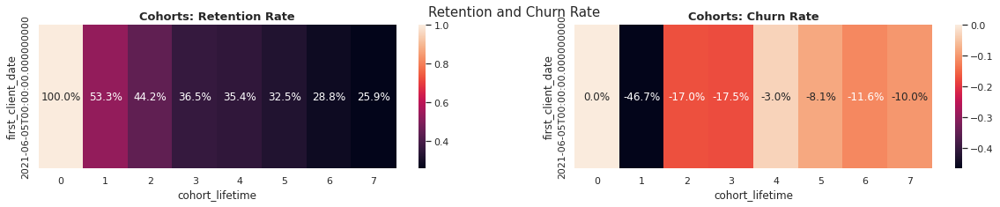

In [73]:
fig, ax = plt.subplots(nrows=1, ncols=2, squeeze=False)
fig.set_size_inches(20,3)
fig.suptitle('Retention and Churn Rate', fontsize=15)

sns.heatmap(retention_pivot, annot=True, fmt='.1%', ax=ax[0,0])
ax[0,0].set_title('Cohorts: Retention Rate', size=13, weight='bold')

sns.heatmap(churn_pivot, annot=True, fmt='.1%', ax=ax[0,1])
ax[0,1].set_title('Cohorts: Churn Rate', size=13, weight='bold')

plt.show()

### Оценка трафика

Часть пользователей в датасете пришли по одной рекламной кампании. Для нее мы знаем CPI - $1.8

**Задача**. Оценить эффективность этой рекламной кампании

**CPI** (Cost per Install) – стоимость установки приложения. Рассчитывается по формуле:

$$CPI = \frac{Затраты \ на \ рекламу \ приложения}{Количество \ установок}$$

Оценить трафик с помощью метрики CPI мы можем 2 способами:
* Простой. Зная формулу CPI и количество установок, мы можем рассчитать затраты на продвижение приложения. Вдобавок к затратам на продвижение, мы можем рассчитать общую выручку за 7 дней, т.к. у нас есть эти данные в датасете. И если затраты на продвижение меньше, чем совокупная выручка - мы в шоколаде. Если нет, то :( 
* Посложнее. Нам нужно будет рассчитать еще одну метрику - LTV. Далее про нее

**LTV/CLV** (Customer lifetime value) - пожизненная ценность клиента, то есть сколько совокупного дохода принес нам пользователь за все время до своего ухода.

* Экономика сходится, то есть все отлично, если LTV > CAC, то есть пользователи приносят нам выручки больше, чем мы затратили на их привлечение.
* Плохо, если LTV <= CAC - тогда мы ничего не зарабатываем с пользователей 

Оставляем только данные с трафика `ad-traffic` и `event_name` == `transactionComplete`

In [74]:
ad_traffic_orders = df.query('media_source == "ad-traffic" and event_name == "transactionComplete"').reset_index(drop=True)

display(ad_traffic_orders.head())
ad_traffic_orders.info()

,user_id,media_source,client_time,session_index,game_status,event_name,event_data,client_date
0,60bb1a304770af6a2faa0575,ad-traffic,2021-06-06 01:18:18,10,"{""coins"":4098,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":125,""map"":1,""bet"":2,""gladeId"":6,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",transactionComplete,"{""inLevel"":false,""usdProceed"":1.3919993453265864,""productDescription"":""Starter Pack""}",2021-06-06
1,60bb1a304770af6a2faa0575,ad-traffic,2021-06-06 04:49:54,12,"{""coins"":4020,""freeRounds"":0,""freeUndo"":2,""freeWildCard"":0,""freeAddCards"":0,""level"":157,""map"":1,""bet"":2,""gladeId"":7,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",transactionComplete,"{""inLevel"":false,""usdProceed"":1.3919993453265864,""productDescription"":""Gold Coins Pack XS""}",2021-06-06
2,60bba5ea7c80da6a9442cbf3,ad-traffic,2021-06-06 10:56:13,25,"{""coins"":2602,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":0,""freeAddCards"":0,""level"":132,""map"":1,""bet"":1,""gladeId"":6,""league"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",transactionComplete,"{""inLevel"":false,""usdProceed"":5.242999999999999,""productDescription"":""Fun Pack""}",2021-06-06
3,60bb042f73c31e6a292b7a53,ad-traffic,2021-06-06 11:48:15,18,"{""coins"":2067,""freeRounds"":0,""freeUndo"":0,""freeWildCard"":1,""freeAddCards"":0,""level"":150,""map"":1,""bet"":1,""gladeId"":10,""league"":0,""VIPPointsAmount"":18,""VIPStatus"":0}",transactionComplete,"{""inLevel"":false,""usdProceed"":1.3919993453265864,""productDescription"":""Starter Pack""}",2021-06-06
4,60bb65db7c80da6a9442cbd7,ad-traffic,2021-06-06 21:45:48,3,"{""coins"":5818,""freeRounds"":0,""freeUndo"":8,""freeWildCard"":0,""freeAddCards"":0,""level"":122,""map"":1,""bet"":2,""gladeId"":6,""league"":0,""gameType"":0,""VIPPointsAmount"":0,""VIPStatus"":0}",transactionComplete,"{""inLevel"":true,""usdProceed"":1.3919993453265864,""productDescription"":""Gold Coins Pack XS""}",2021-06-06


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   user_id        20 non-null     object        
 1   media_source   20 non-null     object        
 2   client_time    20 non-null     datetime64[ns]
 3   session_index  20 non-null     int64         
 4   game_status    20 non-null     object        
 5   event_name     20 non-null     category      
 6   event_data     20 non-null     object        
 7   client_date    20 non-null     datetime64[ns]
dtypes: category(1), datetime64[ns](2), int64(1), object(4)
memory usage: 1.6+ KB


Получим информацию о полученной прибыли, хранится она в `event_data` --> 
`usdProceed` 

In [75]:
def get_info_transactionComplete(row):
    '''
        Функция вытаскивает информацию из столцба event_data, где
        содержатся данные в формате json
    '''

    revenue = row['event_data'].split(',')[1].split(':')[1]

    return float(revenue)

In [76]:
ad_traffic_orders['revenue'] = ad_traffic_orders.apply(get_info_transactionComplete, axis=1)

ad_traffic_orders.drop(['media_source', 'game_status', 'session_index', 'event_name', 'event_data'], axis=1, inplace=True)
ad_traffic_orders.rename(columns={
    'client_time': 'order_time',
    'client_date': 'order_date'
}, inplace=True)

ad_traffic_orders.head()

,user_id,order_time,order_date,revenue
0,60bb1a304770af6a2faa0575,2021-06-06 01:18:18,2021-06-06,1.391999
1,60bb1a304770af6a2faa0575,2021-06-06 04:49:54,2021-06-06,1.391999
2,60bba5ea7c80da6a9442cbf3,2021-06-06 10:56:13,2021-06-06,5.243000
3,60bb042f73c31e6a292b7a53,2021-06-06 11:48:15,2021-06-06,1.391999
4,60bb65db7c80da6a9442cbd7,2021-06-06 21:45:48,2021-06-06,1.391999


In [77]:
print('Количество платящих пользователей:', ad_traffic_orders['user_id'].nunique())
print('Количество транзакций:', ad_traffic_orders.shape[0])
print('В среднем 1 пользователь совершил {} покупки'.format(round(ad_traffic_orders.shape[0] / ad_traffic_orders['user_id'].nunique()), 2))
print('Общая выручка: ${}'.format(round(ad_traffic_orders['revenue'].sum(), 2)))

Количество платящих пользователей: 7
Количество транзакций: 20
В среднем 1 пользователь совершил 3 покупки
Общая выручка: $56.58


7 пользователей совершили 20 внутриигровых покупок в период с 5 по 12 июня и принесли компании $56

#### Простой метод оценки трафика

In [78]:
ad_traffic_count_users = df.query('media_source == "ad-traffic"')['user_id'].nunique()

print(f'С одной рекламной компании мы привлекли {ad_traffic_count_users} пользователей')

С одной рекламной компании мы привлекли 159 пользователей


In [79]:
cpi = 1.8
advertising_costs = 1.8 * ad_traffic_count_users

print(f'На продвижение приложения по данному каналу мы потратили ${advertising_costs}')

На продвижение приложения по данному каналу мы потратили $286.2


* Потратили на продвижение: $286

* Получили выручки: $56

* Ушли в минус на $230

Почему такой расчет может быть некорректным:
* В данном расчете не учитывается выручка, которую пользователь может принести нам в обозримом будущем 

Корректно будет сказать так: за 7 дней данный трафик не окупился. Но, возможно, на восьмой день один из пользователей закупится на $1 млн, и все будут в шоколаде

#### LTV

Получим день первой покупки каждого покупателя

In [80]:
first_orders = (
    ad_traffic_orders
        .groupby('user_id', as_index=False)
        .agg({'order_date': 'min'})
        .rename(columns={'order_date': 'first_order_date'})
)

first_orders.head() 

,user_id,first_order_date
0,60bb042f73c31e6a292b7a53,2021-06-06
1,60bb1a304770af6a2faa0575,2021-06-06
2,60bb51d77c80da6a9442cbcf,2021-06-07
3,60bb65db7c80da6a9442cbd7,2021-06-06
4,60bba5ea7c80da6a9442cbf3,2021-06-06


Считаем количество новых покупателей за каждый день

In [81]:
cohort_sizes = (
    first_orders.groupby('first_order_date', as_index=False)
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id': 'n_buyers'})
)

cohort_sizes.head()

,first_order_date,n_buyers
0,2021-06-06,4
1,2021-06-07,1
2,2021-06-08,2


Скудно, конечно, было бы интереснее, если бы данных было больше:)

Формируем когорты. Добавим день первой покупки каждого покупателя в таблицу с транзакциями

In [82]:
orders = pd.merge(ad_traffic_orders, first_orders, on='user_id')

orders.head()

,user_id,order_time,order_date,revenue,first_order_date
0,60bb1a304770af6a2faa0575,2021-06-06 01:18:18,2021-06-06,1.391999,2021-06-06
1,60bb1a304770af6a2faa0575,2021-06-06 04:49:54,2021-06-06,1.391999,2021-06-06
2,60bb1a304770af6a2faa0575,2021-06-10 15:02:50,2021-06-10,3.428369,2021-06-06
3,60bb1a304770af6a2faa0575,2021-06-11 06:32:38,2021-06-11,5.243000,2021-06-06
4,60bba5ea7c80da6a9442cbf3,2021-06-06 10:56:13,2021-06-06,5.243000,2021-06-06


In [83]:
cohorts = (
    orders
        .groupby(['first_order_date', 'order_date'], as_index=False)
        .agg({'revenue': 'sum'})
)

cohorts.head() 

,first_order_date,order_date,revenue
0,2021-06-06,2021-06-06,10.810997
1,2021-06-06,2021-06-08,2.783999
2,2021-06-06,2021-06-09,1.391999
3,2021-06-06,2021-06-10,4.820369
4,2021-06-06,2021-06-11,5.243000


In [84]:
report = pd.merge(cohort_sizes, cohorts, on='first_order_date')

report.head()

,first_order_date,n_buyers,order_date,revenue
0,2021-06-06,4,2021-06-06,10.810997
1,2021-06-06,4,2021-06-08,2.783999
2,2021-06-06,4,2021-06-09,1.391999
3,2021-06-06,4,2021-06-10,4.820369
4,2021-06-06,4,2021-06-11,5.243000


In [85]:
report['age'] = (
    report['order_date'] - report['first_order_date']
) / np.timedelta64(1, 'D')

report['age'] = report['age'].round().astype('int')
report['ltv'] = report['revenue'] / report['n_buyers']

report.head()

,first_order_date,n_buyers,order_date,revenue,age,ltv
0,2021-06-06,4,2021-06-06,10.810997,0,2.702749
1,2021-06-06,4,2021-06-08,2.783999,2,0.696000
2,2021-06-06,4,2021-06-09,1.391999,3,0.348000
3,2021-06-06,4,2021-06-10,4.820369,4,1.205092
4,2021-06-06,4,2021-06-11,5.243000,5,1.310750


In [86]:
report['first_order_date'] = report['first_order_date'].astype('str')

In [87]:
ltv_pivot = report.pivot_table(
    index='first_order_date',
    columns='age',
    values='ltv',
    aggfunc='mean'
).round(2)

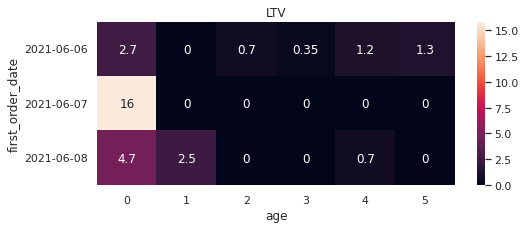

In [88]:
plt.figure(figsize=(8,3))
sns.heatmap(ltv_pivot.fillna(0), annot=True)
plt.title('LTV')
plt.show()

In [89]:
ltv_06 = ltv_pivot.loc['2021-06-06'].sum()
ltv_07 = ltv_pivot.loc['2021-06-07'].sum()
ltv_08 = ltv_pivot.loc['2021-06-08'].sum()

print('Итоговый LTV 1 когорты:', round(ltv_06, 2))
print('Итоговый LTV 2 когорты:', round(ltv_07, 2))
print('Итоговый LTV 3 когорты:', round(ltv_08, 2))
print('Средний LTV:', round((ltv_06+ltv_07+ltv_08)/3, 2))

Итоговый LTV 1 когорты: 6.27
Итоговый LTV 2 когорты: 15.73
Итоговый LTV 3 когорты: 7.9
Средний LTV: 9.97


Почему-то только дойдя до этого момента, я вдруг понял, что не смогу таким способом оценить эффективность трафика, так как CPI у нас известен общий, следовательно, по когортам его не посмотреть и не сравнить с когортным LTV:)

## Общие впечатления (Задание 2)

*Далее всё - мое субъективное мнение*

* Я впервые играю в эту игру, и после первого запуска игры всё как-то быстро продвигается. Толком никакого обучения не было, понажимал на карты, далее экран с какими-то грядками и лошадкой (сперва подумал, что буду сажать картошку как в Счастливой ферме, даже обрадовался)). Возможно, стоит уделить бОльшее время обучению, чтоб пользователь понял основные правила игры и сильнее проникся в эту игру, чтоб прям за душу взяло:)
* Очень приятная графика, музыкальное оформление расслабляет и создает уютную атмосферу, ничего супер лишнего на экране нет.
* К сожалению, у меня нет устройства на android системе, поэтому не могу сказать, насколько удобен UI. Но на BlueStacks все выглядело отлично
* Поиграл пока минут 10, никакой всплывающей рекламы после каждого уровня нет, это огромный плюс. В free-to-play играх, я считаю, главной причиной оттока как раз и является реклама в немыслимых количествах
* Еще играю, и игра ну прям высший класс. Все так плавно, мило-красиво, даже жаль, что на ios не выпускаете

## Мои минусы

Подумал, будет полезно выделить свои недостатки:
* Как вы, вероятно, уже заметили, в проекте я выдвинул мало гипотез и ни одну из них не проверил. Здесь, я думаю, проблема в том, что у меня нет реального рабочего опыта в анализе, и я хотел показать вам, что у меня есть скилы в анализе (надеюсь, есть:)), но нужен опыт, чтобы правильно ими пользоваться. Я проводил анализ результатов A/B-теста, проверял гипотезы между выборками различными способами - корреляционный анализ, стат тесты (параметрические и непараметрические критерии), но на этих данных не придумал способ это реализовать.
* Это самое главное, что я хотел сказать. Уверен, вы заметите еще и другие недостатки, и, в случае, если вам не понравится мой проект и дальнейшего собеседования не будет, я был бы очень рад получить обратную связь. Но очень надеюсь, что проект понравится:)

Спасибо!

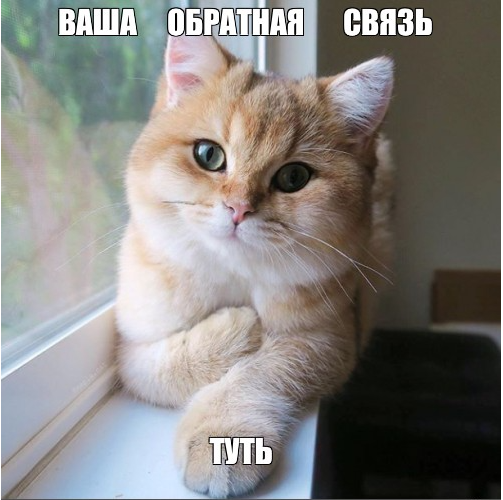